In [1]:
import pandas as pd

df = pd.read_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_materials_graphs_gpt.parquet')
df['y'] = 0
df['text'] = df['gpt_text'] + df['gpt_explanation']
df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_materials_graphs_gpt.parquet')

In [13]:
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained('allenai/scibert_scivocab_cased')
tokenizer.pad_token

'[PAD]'

In [1]:
import pandas as pd
from jarvis.db.figshare import data as jdata
db = pd.DataFrame(jdata('mp_3d_2020'))

Obtaining Materials Project-3D CFID dataset 127k...
Reference:https://doi.org/10.1063/1.4812323
Loading the zipfile...
Loading completed.


In [3]:
from jarvis.core.atoms import Atoms
db['formula'] = db['atoms'].apply(lambda x: Atoms.from_dict(x).composition.reduced_formula)

In [4]:
import pyarrow.parquet as pq
table = pq.read_table('/mnt/hdd1/SESPapers/multi-label/paper_type7.parquet')
df_1 = table.to_pandas()
table = pq.read_table('/mnt/hdd1/SESPapers/multi-label/paper_type2.parquet')
df_2 = table.to_pandas()
df = pd.concat([df_1, df_2])
# text=df['text'].tolist()
# doi=df['doi'].tolist()

In [5]:
len(df)

878483

In [1]:
def search_paper_paragraphs(mat):
    # First check if the formula is in the text
    df['query'] = df['text'].apply(lambda x: mat in x)
    text_series = df['text'][df['query']].apply(lambda x: [p for p in x.split('\n') if mat in p]).to_list()  # list of paragraph including keyword
    doi_series = df['doi'][df['query']].to_list()
    return pd.DataFrame({'text': text_series, 'doi': doi_series})

In [17]:
from joblib import Parallel, delayed
import numpy as np
db_chunk = np.array_split(db, 1200)


/home/yj/anaconda3/envs/llamat/lib/python3.9/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


In [27]:
type(vasp_papers[0])

list

In [186]:
vasp_papers = [{'doi':d, 'text':t } for d,t in vasp_papers.iloc]

In [194]:
anf = []
anf.extend(vasp_papers)
anf.extend(vasp_papers)
anf.extend(vasp_papers)
len(anf)

1401

In [196]:
pubchem_request(electrolytes[0])

[{'CID': 81161,
  'CanonicalSMILES': 'C[Si](C)(C)OC1=CCCCC1',
  'InChI': 'InChI=1S/C9H18OSi/c1-11(2,3)10-9-7-5-4-6-8-9/h7H,4-6,8H2,1-3H3'}]

In [183]:
vasp_papers = search_paper_paragraphs('Ti')
len(vasp_papers), vasp_papers

(467,
                                                   text  \
 0    [High Performance 3D Si/Ge Nanorods Array Anod...   
 1    [In the scenario, the auxiliary battery pack i...   
 2    [CNF films with embedded ultrafine amorphous S...   
 3    [Li-ion batteries (LIBs) have long been the fo...   
 4    [Understanding and controlling ionic conductio...   
 ..                                                 ...   
 462  [Telecommunications sector has been having an ...   
 463  [The depletion of conventional energy resource...   
 464  [TiF3 catalyzed MgH2 as a Li/Na ion battery an...   
 465  [In the past several decades, energy storage m...   
 466  [Rechargeable battery systems, especially lith...   
 
                                 doi  
 0            10.1002/adfm.201403648  
 1           10.1002/2050-7038.12155  
 2            10.1002/adfm.201501498  
 3            10.1002/adfm.201501655  
 4      10.1016/j.chempr.2019.07.001  
 ..                              ...  
 462  10.10

In [18]:

db_chunk[0]['paragraphs'] = db_chunk[0]['formula'].apply(search_paper_paragraphs)
db_chunk[0]

,id,energy,energy_per_atom,volume,formation_energy_per_atom,nsites,unit_cell_formula,pretty_formula,is_hubbard,elements,...,oxide_type,tags,elasticity,piezo,diel,full_formula,atoms,desc,formula,paragraphs
0,mp-1113354,-30.269853,-3.026985,339.868503,-1.042928,10,"{'Cs': 2.0, 'Cu': 1.0, 'Sb': 1.0, 'Br': 6.0}",Cs2CuSbBr6,False,"[Br, Cs, Cu, Sb]",...,None,[],None,None,None,Cs2Cu1Sb1Br6,"{'lattice_mat': [[6.783793260367595, 0.0, 3.91...","[2463.2999999999997, 1584.1019125, 8.088000000...",Cs2CuSbBr6,[[We begin by probing the most energetically f...
1,mp-11279,-11.914603,-5.957301,25.171970,-0.140069,2,"{'Ti': 1.0, 'Be': 1.0}",TiBe,False,"[Ti, Be]",...,None,"[Titanium beryllide (1/1), Beryllium titanium ...","{'G_Reuss': 65.0, 'G_VRH': 75.0, 'G_Voigt': 84...",None,None,Ti1Be1,"{'lattice_mat': [[2.930707, 0.0, 1.79454047339...","[3931.55, 3151.1102250000004, 0.34199999999999...",TiBe,[[Electrochemical deposition is an effective m...
2,mp-11525,-45.033805,-5.629226,152.998194,-0.501786,8,"{'Tm': 4.0, 'Ni': 4.0}",TmNi,False,"[Ni, Tm]",...,None,[Nickel thulium (1/1)],None,None,None,Tm4Ni4,"{'lattice_mat': [[4.102914, 0.0, 2.51231024863...","[4095.675, 2704.6715999999997, 9.47, -100.9688...",TmNi,[[Fig. 1(a) shows the XRD patterns for both th...
3,mp-1175065,-139.623048,-5.817627,218.729028,-1.860331,24,"{'Li': 7.0, 'Mn': 2.0, 'Co': 3.0, 'O': 12.0}",Li7Mn2(CoO4)3,True,"[Co, Li, Mn, O]",...,oxide,[],None,None,None,Li7Mn2Co3O12,"{'lattice_mat': [[3.0181361211329243, 0.0, -0....","[2495.8675000000003, 1809.8808249999997, 4.458...",Li7Mn2Co3O12,[]
4,mp-1176478,-242.979984,-6.749444,432.054775,-2.047105,36,"{'Mn': 3.0, 'Co': 1.0, 'Ni': 2.0, 'P': 6.0, 'O...",Mn3CoNi2(PO4)6,True,"[Co, Mn, Ni, O, P]",...,oxide,[],None,None,None,Mn3Co1Ni2P6O24,"{'lattice_mat': [[7.369919783594425, 0.0, 4.05...","[2498.5640000000003, 1872.1707, 5.782800000000...",Mn3CoNi2P6O24,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,mp-1195999,-295.158920,-6.149144,965.276113,-2.545541,48,"{'Cs': 8.0, 'Cd': 4.0, 'P': 8.0, 'O': 28.0}",Cs2CdP2O7,False,"[Cd, Cs, O, P]",...,oxide,[Dicesium cadmium diphosphate],None,None,None,Cs8Cd4P8O28,"{'lattice_mat': [[5.571975, 0.0, 3.41185067433...","[1167.6299999999999, 656.11765, 1.957499999999...",Cs2CdP2O7,[]
102,mp-1196390,-432.957863,-3.865695,1863.445900,-2.108730,112,"{'Cu': 4.0, 'Sb': 12.0, 'Xe': 4.0, 'F': 92.0}",CuSb3XeF23,False,"[Cu, F, Sb, Xe]",...,None,[(Xenon(VI) pentafluoride) copper(II) tris(hex...,None,None,None,Cu4Sb12Xe4F92,"{'lattice_mat': [[10.470251, 0.0, 6.4111796867...","[-734.87125, 1299.8416124999999, 40.53525, -41...",CuSb3XeF23,[]
103,mp-1196573,-186.871414,-3.893154,1031.317763,1.829027,48,"{'Na': 8.0, 'Yb': 8.0, 'N': 32.0}",NaYbN4,False,"[N, Na, Yb]",...,None,"[Sodium tetraamidoytterbate, Sodium ytterbium ...",None,None,None,Na8Yb8N32,"{'lattice_mat': [[7.745895, 0.0, 4.74299275914...","[1567.278, 900.8220500000001, 4.182, -49.29215...",YbNaN4,[]
104,mp-1196738,-557.863412,-5.692484,1646.196677,-0.990219,98,"{'La': 2.0, 'Pb': 16.0, 'N': 14.0, 'O': 66.0}",LaPb8N7O33,False,"[La, N, O, Pb]",...,oxide,[],None,None,None,La2Pb16N14O66,"{'lattice_mat': [[15.862651860230473, 0.0, 2.1...","[2760.7135, 1483.1688725, 3.6030000000000006, ...",LaPb8N7O33,[]


In [22]:
db_chunk[0][db_chunk[0]['paragraphs'].apply(lambda x: x != [])]

,id,energy,energy_per_atom,volume,formation_energy_per_atom,nsites,unit_cell_formula,pretty_formula,is_hubbard,elements,...,oxide_type,tags,elasticity,piezo,diel,full_formula,atoms,desc,formula,paragraphs
0,mp-1113354,-30.269853,-3.026985,339.868503,-1.042928,10,"{'Cs': 2.0, 'Cu': 1.0, 'Sb': 1.0, 'Br': 6.0}",Cs2CuSbBr6,False,"[Br, Cs, Cu, Sb]",...,None,[],None,None,None,Cs2Cu1Sb1Br6,"{'lattice_mat': [[6.783793260367595, 0.0, 3.91...","[2463.2999999999997, 1584.1019125, 8.088000000...",Cs2CuSbBr6,[[We begin by probing the most energetically f...
1,mp-11279,-11.914603,-5.957301,25.171970,-0.140069,2,"{'Ti': 1.0, 'Be': 1.0}",TiBe,False,"[Ti, Be]",...,None,"[Titanium beryllide (1/1), Beryllium titanium ...","{'G_Reuss': 65.0, 'G_VRH': 75.0, 'G_Voigt': 84...",None,None,Ti1Be1,"{'lattice_mat': [[2.930707, 0.0, 1.79454047339...","[3931.55, 3151.1102250000004, 0.34199999999999...",TiBe,[[Electrochemical deposition is an effective m...
2,mp-11525,-45.033805,-5.629226,152.998194,-0.501786,8,"{'Tm': 4.0, 'Ni': 4.0}",TmNi,False,"[Ni, Tm]",...,None,[Nickel thulium (1/1)],None,None,None,Tm4Ni4,"{'lattice_mat': [[4.102914, 0.0, 2.51231024863...","[4095.675, 2704.6715999999997, 9.47, -100.9688...",TmNi,[[Fig. 1(a) shows the XRD patterns for both th...
5,mp-1176979,-47.003995,-4.273090,160.341553,-1.199018,11,"{'Li': 6.0, 'Fe': 1.0, 'S': 4.0}",Li6FeS4,False,"[Fe, Li, S]",...,None,[],None,None,None,Li6Fe1S4,"{'lattice_mat': [[6.154794950003242, 0.0, -3.9...","[2482.4066666666663, 1822.35177, 5.17666666666...",Li6FeS4,"[[The Li2S + FeSx (x = 1, 2) blended powder wa..."
6,mp-1179088,-35.247875,-4.405984,440.410598,-0.018678,8,"{'Te': 2.0, 'O': 6.0}",TeO3,False,"[O, Te]",...,superoxide,[],None,None,None,Te2O6,"{'lattice_mat': [[8.558852616135805, 0.0, 2.15...","[909.7599999999999, 675.688, 6.869999999999999...",TeO3,[[Materials: All chemicals applied for our exp...
9,mp-1184904,-11.057125,-2.764281,100.732310,0.056504,4,"{'In': 3.0, 'Ga': 1.0}",In3Ga,False,"[Ga, In]",...,None,[],None,None,None,In3Ga1,"{'lattice_mat': [[4.306408187945496, 0.0, -3.5...","[3427.425, 2411.0443800000003, 2.1674999999999...",In3Ga,"[[Before developing the model, two assumptions..."
14,mp-13064,-41.735260,-8.347052,68.963720,-3.956938,5,"{'Dy': 2.0, 'O': 3.0}",Dy2O3,False,"[Dy, O]",...,oxide,[],None,None,None,Dy2O3,"{'lattice_mat': [[3.68004795, 0.0, 2.253379471...","[2512.06, 1465.15785, 5.115, -71.0647, 0.0, 79...",Dy2O3,[[ABO3 type crystals that exhibit the perovski...
15,mp-1184010,-12.170320,-3.042580,95.117325,0.014313,4,"{'Ga': 3.0, 'Te': 1.0}",Ga3Te,False,"[Ga, Te]",...,None,[],None,None,None,Ga3Te1,"{'lattice_mat': [[4.052067142193234, 0.0, -4.2...","[2492.75, 1869.114825, 5.4775, -82.5315, 0.0, ...",Ga3Te,"[[In recent decades, enormous efforts have bee..."
16,mp-1185779,-19.121483,-3.186914,140.273442,-0.011494,6,"{'Mg': 4.0, 'Sc': 2.0}",Mg2Sc,False,"[Mg, Sc]",...,None,[],None,None,None,Mg4Sc2,"{'lattice_mat': [[6.050207679379558, 0.0, 1.55...","[3504.65, 2233.1129, 0.9955000000000002, -20.1...",Mg2Sc,"[[As reported previously, the Ti-V based solid..."
18,mp-13089,-22.462915,-3.743819,176.505751,-0.140384,6,"{'Cu': 2.0, 'Sn': 1.0, 'Te': 3.0}",Cu2SnTe3,False,"[Cu, Sn, Te]",...,None,[Dicopper tin telluride],"{'G_Reuss': 19.0, 'G_VRH': 20.0, 'G_Voigt': 21...",None,None,Cu2Sn1Te3,"{'lattice_mat': [[5.590769784730889, 0.0, -5.0...","[3418.0499999999997, 2445.4604333333336, 9.694...",Cu2SnTe3,"[[In the following, we continue discussing the..."


In [11]:

def chunk_serch(chunk):
    chunk['paragraphs'] = chunk['formula'].apply(search_paper_paragraphs)
    chunk

result = Parallel(n_jobs=12)(delayed(chunk_serch)(chunk) for chunk in db_chunk)
result = pd.concat(result)

([['Bismuth-based sulfide materials have received lots of attention due to the abundant structure, composition with tunable electronic states, which show promising applications in photovoltaic solar absorber,1,2 electron acceptor,3 high external quantum efficiency photoconductive response material,4 photocatalysis for azo dye degradation,5,6 solution-processed solar cells applications,7 sensitizer for quantum dot solar cells,8 cancer diagnosis,9 photothermal theragnosis synergistic therapy,10 and bioimaging and especially thermoelectric materials.11 The nature of Bi2S3 is attributed to a n-type semiconductor with excellent thermoelectric property.12,13 The key to improve thermoelectric properties of materials is to enhance the electrical conductivity and increase Seebeck coefficient and reduce the thermal conductivity. High Bi ratio compound of K2Bi8S13 has been reported to display an essentially metallic conduction.14 Recently, Ge et al. reported that the composite of Bi/Bi2S3 holds h

In [38]:
search_paper_paragraphs('nuclear power')

[["Nuclear power as a carbon-free energy or fusion energy, is one of the most potential energy for solving the world energy crisis (). Along with the development of the nuclear power industry, uranium, one main nuclear reaction radionuclide, has caused some environmental and human health problems primarily due to the long half-life and chemical toxicity (; ). Therefore, it is urgent to disposal uranium containing wastewater. For this purpose, many traditional methods have been reported to remove uranium from industrial waste waters, such as chemical precipitation, ion exchange, membrane filtration, solvent extraction and adsorption (; ; ). However, severe technical defects (e.g., intensive energy, high cost and rigorous reaction condition) have enormously restricted their application (, ). Uranium (U) exists in many chemical valence (such as U (0), U(III), U(IV) and U(VI)), soluble U(VI) and slightly soluble U(IV) have been recognized as the major species of nature (; ;, ). Reduction o

In [45]:
import pubchempy as pcp
get_result = pcp.get_compounds('4-(2,2,3,3,4,4,5,5,5-nonafluoropentyl)-1,3-dioxolan-2-one', namespace='name', record_type='3d' )


In [ ]:
from tqdm import tqdm

In [79]:
with open('liquid_electrolytes.txt', 'r') as f:
    electrolytes = f.readlines()
electrolytes = [elect.split('\n')[0] for elect in electrolytes]

get_result = []
for elect in tqdm(electrolytes):
    elect_pubchem = pcp.get_compounds(elect, namespace='name')
    try:  # If not found, skip
        item = {'name':elect, 'SMILES':elect_pubchem[0].canonical_smiles, 'InChI':elect_pubchem[0].inchi}
        # result = search_paper_paragraphs(elect)
        # item['paragraphs'] = result
        # item['num_papers'] = len(result)
        get_result.append(item)
    except:
        pass

In [3]:
pubchem_request('CCO', key='smiles', task='fastsimilarity_2d', max_records=10)

[{'CID': 702,
  'CanonicalSMILES': 'CCO',
  'InChI': 'InChI=1S/C2H6O/c1-2-3/h3H,2H2,1H3',
  'IUPACName': 'ethanol'},
 {'CID': 123093,
  'CanonicalSMILES': 'CCO',
  'InChI': 'InChI=1S/C2H6O/c1-2-3/h3H,2H2,1H3/i3D',
  'IUPACName': 'deuteriooxyethane'},
 {'CID': 102138,
  'CanonicalSMILES': 'CCO',
  'InChI': 'InChI=1S/C2H6O/c1-2-3/h3H,2H2,1H3/i1D3,2D2,3D',
  'IUPACName': '1,1,1,2,2-pentadeuterio-2-deuteriooxyethane'},
 {'CID': 45051902,
  'CanonicalSMILES': 'CCO.[Ta]',
  'InChI': 'InChI=1S/C2H6O.Ta/c1-2-3;/h3H,2H2,1H3;',
  'IUPACName': 'ethanol;tantalum'},
 {'CID': 22743359,
  'CanonicalSMILES': 'CCO.[Ti]',
  'InChI': 'InChI=1S/C2H6O.Ti/c1-2-3;/h3H,2H2,1H3;',
  'IUPACName': 'ethanol;titanium'},
 {'CID': 16211297,
  'CanonicalSMILES': 'CCO.[Tl]',
  'InChI': 'InChI=1S/C2H6O.Tl/c1-2-3;/h3H,2H2,1H3;'},
 {'CID': 12201693,
  'CanonicalSMILES': 'CCO',
  'InChI': 'InChI=1S/C2H6O/c1-2-3/h3H,2H2,1H3/i1D3,2D2',
  'IUPACName': '1,1,2,2,2-pentadeuterioethanol'},
 {'CID': 45051570,
  'CanonicalSMILES':

In [143]:
pd.DataFrame(battery['contents'])

,doi,text
0,10.1016/j.commatsci.2015.05.022,First-principles molecular simulations of Li d...
1,10.1002/adfm.201402833,Few‐Layered SnS2 on Few‐Layered Reduced Graphe...
2,10.1002/adfm.201403648,High Performance 3D Si/Ge Nanorods Array Anode...
3,10.1002/2050-7038.12155,"Contribution management of lead‐acid battery, ..."
4,10.1002/adfm.201501498,Ultrafine Amorphous SnOx Embedded in Carbon Na...
...,...,...
250888,10.1016/j.actamat.2022.117898,Inverse design of crystal structures for multi...
250889,10.1016/j.apenergy.2018.09.093,Data center holistic demand response algorithm...
250890,10.1016/j.jclepro.2020.121081,Clean production of Zeolitic Imidazolate Frame...
250891,10.1016/j.wasman.2012.09.006,The new challenges of end-of-life tyres manage...


In [ ]:
import json

battery

In [ ]:
papers = []
for elect in electrolytes:
    result = search_paper_paragraphs(elect)
    papers.append((len(result), result))
papers

In [63]:
len([p[0] if p[1] != [] else 0 for p in papers ]) , sum([p[0] if p[1] != [] else 0 for p in papers ])

(216, 34178)

In [8]:
import json
import pyarrow.parquet as pq
import pandas as pd
import numpy as np

args = {}
args['list_of_electrolytes'] = 'data/liquid_electrolytes.txt'
args['battery_papers'] = '/mnt/hdd1/SESPapers/ses_papers_battery_reclassification.json'
args['materials_science_papers_1'] = '/mnt/hdd1/SESPapers/multi-label/paper_type7.parquet'
args['materials_science_papers_2'] = '/mnt/hdd1/SESPapers/multi-label/paper_type2.parquet'
args['output_battery'] = '/home/yj/PycharmProjects/MIT/CLaMP/liquid_electrolytes.json'
args['output_similarity'] = 'liquid_electrolytes_with_similarity.json'
with open(args['output_battery'], 'r') as f:
    elect_with_paragraphs = json.load(f)
# expand papers from battery to materials science
table = pq.read_table(args['materials_science_papers_1'])
df_1 = table.to_pandas()
table = pq.read_table(args['materials_science_papers_2'])
df_2 = table.to_pandas()
df = pd.concat([df_1, df_2])
df = df.iloc[:10000]

electrolytes = [elect for elect in elect_with_paragraphs]  # change to smiles
elec_chunks = np.array_split(electrolytes, 12)
# Parallel processing

In [25]:

def treat_chunk_with_similarity(chunk):
    '''
    input: list of str
    items: list of dict
    item: dict
        SMILES, InChI, name, list(papers(list(paragraphs))), num_papers
    return: list of dict
    '''
    get_result = [] 
    for elect in tqdm(chunk):
        try:
            # find similar molecules with anchor
            items = pubchem_request(elect['CanonicalSMILES'], key='smiles', task='fastsimilarity_2d', max_records=20)
            for item in items:
                try:  # If not found, skip
                    result = search_paper_paragraphs(df, item['IUPACName'])
                    item['paragraphs'] = result[0]
                    item['doi'] = result[1]
                    item['num_papers'] = len(result[1])
                    if item['num_papers'] > 0:
                        get_result.append(item)
                except:
                    pass
        except:
            pass
    return get_result

In [9]:
parallel_result = []

In [26]:
temp = treat_chunk_with_similarity(elec_chunks[2])

  0%|          | 0/14 [00:00<?, ?it/s]

CO[Si](C)(CCCS)OC


  7%|▋         | 1/14 [00:03<00:49,  3.82s/it]

C1C(OC(=O)O1)CC(C(C(C(F)(F)F)(F)F)(F)F)(F)F


 14%|█▍        | 2/14 [00:07<00:47,  4.00s/it]

C1C(OC(=O)O1)F


 21%|██▏       | 3/14 [00:12<00:45,  4.15s/it]

C1=CC(=CC=C1[N+](=O)[O-])OC(=O)C(F)(F)F


 29%|██▊       | 4/14 [00:17<00:44,  4.44s/it]

C=CC1COC(=O)O1


 36%|███▌      | 5/14 [00:21<00:40,  4.45s/it]

C1=CN=CC=C1C2=CC=NC=C2


 43%|████▎     | 6/14 [00:25<00:34,  4.29s/it]

CC#N


 50%|█████     | 7/14 [00:26<00:22,  3.18s/it]

[NH4+].F[P-](F)(F)(F)(F)F


 57%|█████▋    | 8/14 [00:29<00:18,  3.05s/it]

C1=CC=C(C=C1)C(=O)N


 64%|██████▍   | 9/14 [00:34<00:18,  3.70s/it]

COCCOCCOC


 71%|███████▏  | 10/14 [00:39<00:16,  4.02s/it]

C(C(F)(F)F)OCOCC(F)(F)F


 79%|███████▊  | 11/14 [00:43<00:12,  4.05s/it]

C(C(F)(F)F)OC(=O)OCC(F)(F)F


 86%|████████▌ | 12/14 [00:47<00:08,  4.23s/it]

C(C(F)(F)F)OC(=O)OCC(F)(F)F


 93%|█████████▎| 13/14 [00:52<00:04,  4.36s/it]

C(C(F)(F)F)OCC(F)(F)F


100%|██████████| 14/14 [00:56<00:00,  4.07s/it]


In [28]:
for elec in elec_chunks[2]:
    print(elec['IUPACName'])
print('here')
for t in temp:
    print(t['IUPACName'])

3-[dimethoxy(methyl)silyl]propane-1-thiol
4-(2,2,3,3,4,4,5,5,5-nonafluoropentyl)-1,3-dioxolan-2-one
4-fluoro-1,3-dioxolan-2-one
(4-nitrophenyl) 2,2,2-trifluoroacetate
4-ethenyl-1,3-dioxolan-2-one
4-pyridin-4-ylpyridine
acetonitrile
azanium;hexafluorophosphate
benzamide
1-methoxy-2-(2-methoxyethoxy)ethane
1,1,1-trifluoro-2-(2,2,2-trifluoroethoxymethoxy)ethane
bis(2,2,2-trifluoroethyl) carbonate
bis(2,2,2-trifluoroethyl) carbonate
1,1,1-trifluoro-2-(2,2,2-trifluoroethoxy)ethane
here
4,5-difluoro-1,3-dioxolan-2-one
4-ethylpyridine
benzamide
1,2-dimethoxyethane


In [37]:
import requests
def pubchem_request(name, key='name', task=None, max_records=1, structure_type=None):
    url = 'https://pubchem.ncbi.nlm.nih.gov/rest/pug/compound/'
    if task == 'fastsimilarity_2d':
        url += task + '/'
    url += f'{key}/{name}/property/CanonicalSMILES,InChI,IUPACName/JSON?MaxRecords={max_records}'
    if structure_type == '3d':
        url += '&record_type=3d'
    response = requests.get(url)
    return response.json()['PropertyTable']['Properties']
pubchem_request('CO[Si](C)(CCCS)OC', key='smiles', task='fastsimilarity_2d', max_records=15)

[{'CID': 20473,
  'CanonicalSMILES': 'CO[Si](CCCS)(OC)OC',
  'InChI': 'InChI=1S/C6H16O3SSi/c1-7-11(8-2,9-3)6-4-5-10/h10H,4-6H2,1-3H3',
  'IUPACName': '3-trimethoxysilylpropane-1-thiol'},
 {'CID': 2759524,
  'CanonicalSMILES': 'CO[Si](C)(CCCS)OC',
  'InChI': 'InChI=1S/C6H16O2SSi/c1-7-10(3,8-2)6-4-5-9/h9H,4-6H2,1-3H3',
  'IUPACName': '3-[dimethoxy(methyl)silyl]propane-1-thiol'},
 {'CID': 84673,
  'CanonicalSMILES': 'CO[Si](C)(C)CCCS',
  'InChI': 'InChI=1S/C6H16OSSi/c1-7-9(2,3)6-4-5-8/h8H,4-6H2,1-3H3',
  'IUPACName': '3-[methoxy(dimethyl)silyl]propane-1-thiol'},
 {'CID': 87323776,
  'CanonicalSMILES': 'CCC[Si](C)(OC)OCS',
  'InChI': 'InChI=1S/C6H16O2SSi/c1-4-5-10(3,7-2)8-6-9/h9H,4-6H2,1-3H3',
  'IUPACName': '(methoxy-methyl-propylsilyl)oxymethanethiol'},
 {'CID': 21862945,
  'CanonicalSMILES': 'CCC([Si](OC)(OC)OC)S',
  'InChI': 'InChI=1S/C6H16O3SSi/c1-5-6(10)11(7-2,8-3)9-4/h6,10H,5H2,1-4H3',
  'IUPACName': '1-trimethoxysilylpropane-1-thiol'},
 {'CID': 19063520,
  'CanonicalSMILES': 'CC(C[

In [ ]:

parallel_result = Parallel(n_jobs=12)(delayed(treat_chunk_with_similarity)(chunk) for chunk in elec_chunks)
elect_with_paragraphs = []
for result in parallel_result:
    elect_with_paragraphs.extend(result)

In [60]:
import json
args = {}
args['list_of_electrolytes'] = 'data/liquid_electrolytes.txt'
args['battery_papers'] = '/mnt/hdd1/SESPapers/ses_papers_battery_reclassification.json'
args['materials_science_papers_1'] = '/mnt/hdd1/SESPapers/multi-label/paper_type7.parquet'
args['materials_science_papers_2'] = '/mnt/hdd1/SESPapers/multi-label/paper_type2.parquet'
args['output_battery'] = '/home/yj/PycharmProjects/MIT/CLaMP/jsons/liquid_electrolytes_data.json'
args['output_similarity'] = '/home/yj/PycharmProjects/MIT/CLaMP/jsons/liquid_electrolytes_with_similarity_data.json'
# Save as json
# with open(args['output_battery'], 'r') as f:
#     elect_with_paragraphs = json.load(f)


In [61]:
import pandas as pd

# json_para = pd.DataFrame(elect_with_paragraphs)
# json_para

In [16]:
to_json = []
for item in json_para.iloc:
    to_json.append({k: v for k, v in item.items()})

In [66]:

# Save as json
with open(args['output_battery'], 'r') as f:
    elect_with_paragraphs = json.load(f)
# Save as json
with open(args['output_similarity'], 'r') as f:
    elect_with_paragraphs_sim = json.load(f)
# remove duplicates
battery_json = pd.DataFrame(elect_with_paragraphs)
similarity_json = pd.DataFrame(elect_with_paragraphs_sim)
similarity_json

,CID,CanonicalSMILES,InChI,IUPACName,paragraphs,doi,num_papers
0,15617,CC1=NC=CN1C,"InChI=1S/C5H8N2/c1-5-6-3-4-7(5)2/h3-4H,1-2H3","1,2-dimethylimidazole","[[In a 100mL high pressure reactor, 1-methylim...","[10.1016/j.jpowsour.2008.04.047, 10.1039/c3ta1...",169
1,1390,CN1C=CN=C1,"InChI=1S/C4H6N2/c1-6-3-2-5-4-6/h2-4H,1H3",1-methylimidazole,[[All chemicals were of reagent grade and used...,"[10.1002/chem.201200255, 10.1002/pssa.20098374...",1280
2,61347,CCCCN1C=CN=C1,"InChI=1S/C7H12N2/c1-2-3-5-9-6-4-8-7-9/h4,6-7H,...",1-butylimidazole,"[[Imidazole (99%), 2-methylimidazole (99%), 1-...","[10.1016/j.jpowsour.2008.04.047, 10.1016/j.mem...",132
3,529334,CCCCCN1C=CN=C1,"InChI=1S/C8H14N2/c1-2-3-4-6-10-7-5-9-8-10/h5,7...",1-pentylimidazole,[[1-Pentylimidazole and 1-octylimidazole were ...,[10.1002/pola.22881],1
4,118785,CCCN1C=CN=C1,"InChI=1S/C6H10N2/c1-2-4-8-5-3-7-6-8/h3,5-6H,2,...",1-propylimidazole,"[[1-Methylimidazole, 1-ethylimidazole, 1-propy...","[10.1021/acs.jpcc.7b09315, 10.1039/c4cp03648d,...",6
...,...,...,...,...,...,...,...
279,17682,CCCCOP(=O)(OC1=CC=CC=C1)OC2=CC=CC=C2,"InChI=1S/C16H19O4P/c1-2-3-14-18-21(17,19-15-10...",butyl diphenyl phosphate,[[The extractant was synthesized though Grigna...,[10.1016/j.hydromet.2017.06.013],1
280,3599767,B(OCC(F)(F)F)(OCC(F)(F)F)OCC(F)(F)F,"InChI=1S/C6H6BF9O3/c8-4(9,10)1-17-7(18-2-5(11,...","tris(2,2,2-trifluoroethyl) borate","[[GBL, which is often used as a solvent for th...","[10.1016/j.jpowsour.2016.01.075, 10.1021/acs.c...",5
281,272683,C[Si](C)(C)P([Si](C)(C)C)[Si](C)(C)C,"InChI=1S/C9H27PSi3/c1-11(2,3)10(12(4,5)6)13(7,...",tris(trimethylsilyl)phosphane,[[Silylated phosphanes and phosphides are usef...,"[10.1039/d1dt04223h, 10.1002/anie.200353562]",2
282,160738647,C[Si](C)(C)C.C[Si](C)(C)C,"InChI=1S/2C4H12Si/c2*1-5(2,3)4/h2*1-4H3",tetramethylsilane,[[General: b-Cyclodextrin was dried prior to u...,[10.1002/1521-3765(20011001)7:19<4164::aid-che...,7540


In [5]:
dedup_df = pd.read_json('/home/yj/PycharmProjects/MIT/CLaMP/all_dedup_cif.json')


In [6]:
dedup_df

,reduced_formula,spg,crystal system,lattice_parameters,formula,volume,cif
0,ZnB,P-6m2,hexagonal,"[1.129665, 1.12967, 1.84474, 90.0, 90.0, 119.9...",ZnB,2.038766e+00,CIF file generated using JARVIS-Tools package....
1,H,Fm-3m,cubic,"[1.568646, 1.568646, 1.568646, 120.0, 90.0, 12...",H,2.729382e+00,CIF file generated using JARVIS-Tools package....
2,H,Im-3m,cubic,"[1.525486, 1.525486, 1.525486, 109.4712, 109.4...",H,2.732789e+00,CIF file generated using JARVIS-Tools package....
3,He,Fm-3m,cubic,"[1.689137, 1.689137, 1.689137, 60.0, 60.0, 60.0]",He,3.407870e+00,CIF file generated using JARVIS-Tools package....
4,He,Im-3m,cubic,"[1.6448070000000001, 1.6448070000000001, 1.644...",He,3.425498e+00,CIF file generated using JARVIS-Tools package....
...,...,...,...,...,...,...,...
671153,RbNpO3,P4mm,tetragonal,"[266.96756, 266.96756, 285.8849, 90.0, 90.0, 9...",RbNpO3,2.037550e+07,CIF file generated using JARVIS-Tools package....
671154,NpTiO3,P4mm,tetragonal,"[266.96756, 266.96756, 285.8849, 90.0, 90.0, 9...",NpTiO3,2.037550e+07,CIF file generated using JARVIS-Tools package....
671155,NpScO3,P4mm,tetragonal,"[266.96756, 266.96756, 285.8849, 90.0, 90.0, 9...",NpScO3,2.037550e+07,CIF file generated using JARVIS-Tools package....
671156,NpTaO3,P4mm,tetragonal,"[266.96756, 266.96756, 285.8849, 90.0, 90.0, 9...",NpTaO3,2.037550e+07,CIF file generated using JARVIS-Tools package....


In [69]:
all_dois = []
for item in elect_with_paragraphs_sim:
    all_dois.extend(item['doi'][:15])
all_dois = list(set(all_dois))
len(all_dois)

1343

In [4]:
import pandas as pd

df = pd.read_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_cif_papers.parquet')

In [6]:
# sort df by index
df = df.sort_index()
df

,reduced_formula,spg,crystal system,lattice_parameters,formula,volume,cif,doi,num_papers,edge_index,edge_attr,node_feat,y,text
0,TmNi,Pnma,orthorhombic,"[4.10291, 5.36576, 6.94965, 90.0, 90.0, 90.0]",Tm4Ni4,152.998194,data_TmNi\n_symmetry_space_group_name_H-M 'Pn...,10.1007/s10832-007-9124-4,2,"[[0, 1, 0, 1, 0, 4, 0, 4, 0, 6, 0, 6, 0, 5, 0,...","[[-0.5171929597854614, 2.051455020904541, -1.3...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],The ever-increasing demand for high-performanc...
0,TiBe,Pm-3m,cubic,"[2.93071, 2.93071, 2.93071, 90.0, 90.0, 90.0]",TiBe,25.171970,data_TiBe\n_symmetry_space_group_name_H-M 'Pm...,10.1016/j.optmat.2011.08.030,2,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,...","[[1.4653550386428833, -1.4653550386428833, -1....","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],Ti to Al composition ratio (CTi/CAl) as a func...
0,TmNi,Pnma,orthorhombic,"[4.10291, 5.36576, 6.94965, 90.0, 90.0, 90.0]",Tm4Ni4,152.998194,data_TmNi\n_symmetry_space_group_name_H-M 'Pn...,10.1016/j.jallcom.2019.152596,2,"[[0, 1, 0, 1, 0, 4, 0, 4, 0, 6, 0, 6, 0, 5, 0,...","[[-0.5171929597854614, 2.051455020904541, -1.3...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],"Study on half-Heusler compounds RENiSb, RE = S..."
0,TiBe,Pm-3m,cubic,"[2.93071, 2.93071, 2.93071, 90.0, 90.0, 90.0]",TiBe,25.171970,data_TiBe\n_symmetry_space_group_name_H-M 'Pm...,10.1016/j.jallcom.2010.11.071,1,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,...","[[1.4653550386428833, -1.4653550386428833, -1....","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],Fig. 1 shows a bright-field TEM image with ins...
0,TiBe,Pm-3m,cubic,"[2.93071, 2.93071, 2.93071, 90.0, 90.0, 90.0]",TiBe,25.171970,data_TiBe\n_symmetry_space_group_name_H-M 'Pm...,10.1016/j.jallcom.2010.04.039,1,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,...","[[1.4653550386428833, -1.4653550386428833, -1....","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],Table 1 reports the results of thermal analysi...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20672,V3S4,P6_3/m,hexagonal,"[9.08517, 9.085174, 3.25619, 90.0, 90.0, 120.0]",V6S8,232.759121,data_V3S4\n_symmetry_space_group_name_H-M 'P6...,10.1039/d0qi00985g,2,"[[0, 9, 0, 9, 0, 10, 0, 10, 0, 13, 0, 13, 0, 4...","[[-1.1388251781463623, 1.3956764936447144, -1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],"Over the past thirty years, lithium-ion batter..."
20672,V3S4,P6_3/m,hexagonal,"[9.08517, 9.085174, 3.25619, 90.0, 90.0, 120.0]",V6S8,232.759121,data_V3S4\n_symmetry_space_group_name_H-M 'P6...,10.1016/j.jcis.2019.06.105,2,"[[0, 9, 0, 9, 0, 10, 0, 10, 0, 13, 0, 13, 0, 4...","[[-1.1388251781463623, 1.3956764936447144, -1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],Along with the further progress of modern indu...
20673,Fe2O3,Cmcm,orthorhombic,"[5.17955, 5.179548, 15.91706, 90.0, 90.0, 146....",Fe8O2,238.120896,data_Fe2O3\n_symmetry_space_group_name_H-M 'C...,10.1016/j.energy.2010.08.010,2,"[[0, 14, 0, 10, 0, 10, 0, 11, 0, 13, 0, 13, 0,...","[[1.2001427022730807e-17, 1.0502866506576538, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",[0],TiO2 is a well known wide band gap metal oxide...
20673,Fe2O3,Cmcm,orthorhombic,"[5.17955, 5.179548, 15.91706, 90.0, 90.0, 146....",Fe8O2,238.120896,data_Fe2O3\n_symmetry_space_group_name_H-M 'C...,10.1016/j.electacta.2016.06.067,2,"[[0, 14, 0, 10, 0, 10, 0, 11, 0, 13, 0, 13, 0,...","[[1.2001427022730807e-17, 1.0502866506576538, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",[0],"As shown in Fig. 1, Fe(CO)5 precursor solution..."


In [12]:
train_df = df.iloc[:int(len(df)*0.8)]
val_df = df.iloc[int(len(df)*0.8):int(len(df)*0.9)]
test_df = df.iloc[int(len(df)*0.9):]

train_df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_cif_papers_train.parquet')
val_df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_cif_papers_val.parquet')
test_df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_cif_papers_test.parquet')

In [63]:
hetgal = []
for row in similarity_json.iloc:
    item = {}
    for k, v in row.items():
        if k == 'doi' or k == 'paragraphs':
            item[k] = v#[:15]
        elif k == 'num_papers':
            if v > 15:
                item[k] = 15
            else:
                item[k] = v
        else:
            item[k] = v
    hetgal.append(item)
hetgal = pd.DataFrame(hetgal)
hetgal

,CID,CanonicalSMILES,InChI,IUPACName,paragraphs,doi,num_papers
0,15617,CC1=NC=CN1C,"InChI=1S/C5H8N2/c1-5-6-3-4-7(5)2/h3-4H,1-2H3","1,2-dimethylimidazole","[[In a 100mL high pressure reactor, 1-methylim...","[10.1016/j.jpowsour.2008.04.047, 10.1039/c3ta1...",15
1,1390,CN1C=CN=C1,"InChI=1S/C4H6N2/c1-6-3-2-5-4-6/h2-4H,1H3",1-methylimidazole,[[All chemicals were of reagent grade and used...,"[10.1002/chem.201200255, 10.1002/pssa.20098374...",15
2,61347,CCCCN1C=CN=C1,"InChI=1S/C7H12N2/c1-2-3-5-9-6-4-8-7-9/h4,6-7H,...",1-butylimidazole,"[[Imidazole (99%), 2-methylimidazole (99%), 1-...","[10.1016/j.jpowsour.2008.04.047, 10.1016/j.mem...",15
3,529334,CCCCCN1C=CN=C1,"InChI=1S/C8H14N2/c1-2-3-4-6-10-7-5-9-8-10/h5,7...",1-pentylimidazole,[[1-Pentylimidazole and 1-octylimidazole were ...,[10.1002/pola.22881],1
4,118785,CCCN1C=CN=C1,"InChI=1S/C6H10N2/c1-2-4-8-5-3-7-6-8/h3,5-6H,2,...",1-propylimidazole,"[[1-Methylimidazole, 1-ethylimidazole, 1-propy...","[10.1021/acs.jpcc.7b09315, 10.1039/c4cp03648d,...",6
...,...,...,...,...,...,...,...
279,17682,CCCCOP(=O)(OC1=CC=CC=C1)OC2=CC=CC=C2,"InChI=1S/C16H19O4P/c1-2-3-14-18-21(17,19-15-10...",butyl diphenyl phosphate,[[The extractant was synthesized though Grigna...,[10.1016/j.hydromet.2017.06.013],1
280,3599767,B(OCC(F)(F)F)(OCC(F)(F)F)OCC(F)(F)F,"InChI=1S/C6H6BF9O3/c8-4(9,10)1-17-7(18-2-5(11,...","tris(2,2,2-trifluoroethyl) borate","[[GBL, which is often used as a solvent for th...","[10.1016/j.jpowsour.2016.01.075, 10.1021/acs.c...",5
281,272683,C[Si](C)(C)P([Si](C)(C)C)[Si](C)(C)C,"InChI=1S/C9H27PSi3/c1-11(2,3)10(12(4,5)6)13(7,...",tris(trimethylsilyl)phosphane,[[Silylated phosphanes and phosphides are usef...,"[10.1039/d1dt04223h, 10.1002/anie.200353562]",2
282,160738647,C[Si](C)(C)C.C[Si](C)(C)C,"InChI=1S/2C4H12Si/c2*1-5(2,3)4/h2*1-4H3",tetramethylsilane,[[General: b-Cyclodextrin was dried prior to u...,[10.1002/1521-3765(20011001)7:19<4164::aid-che...,15


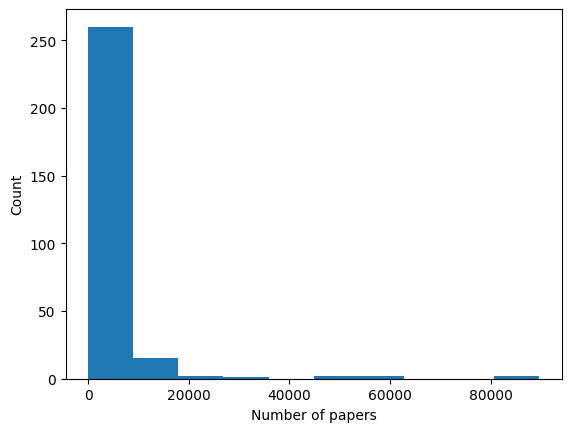

In [67]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.hist(similarity_json['num_papers'], bins=10)
plt.xlabel('Number of papers')
plt.ylabel('Count')
plt.show()



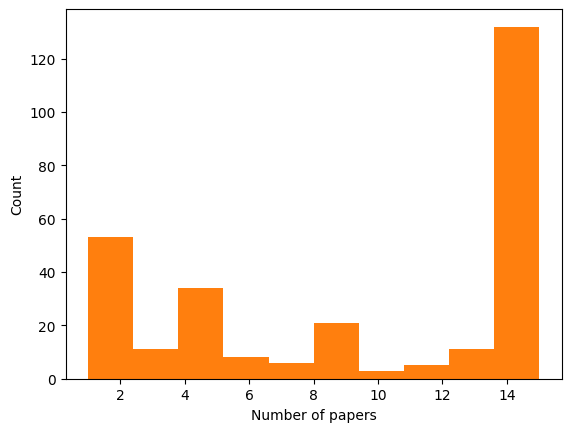

In [65]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.hist(hetgal['num_papers'], bins=10)
plt.xlabel('Number of papers')
plt.ylabel('Count')
plt.show()



In [8]:
len(battery_json)

120

In [7]:
# shuffle
# Shuffle the rows
similarity_json = similarity_json.sample(frac=1, random_state=42).reset_index(drop=True)

# Reset index if needed
similarity_json =similarity_json.reset_index(drop=True)
similarity_json

,CID,CanonicalSMILES,InChI,IUPACName,paragraphs,doi,num_papers
0,15617,CC1=NC=CN1C,"InChI=1S/C5H8N2/c1-5-6-3-4-7(5)2/h3-4H,1-2H3","1,2-dimethylimidazole","[[In a 100mL high pressure reactor, 1-methylim...","[10.1016/j.jpowsour.2008.04.047, 10.1039/c3ta1...",169
1,7407,CC(=C)C1=CC=CC=C1,"InChI=1S/C9H10/c1-8(2)9-6-4-3-5-7-9/h3-7H,1H2,2H3",prop-1-en-2-ylbenzene,"[[According to the general procedure, 2e was p...","[10.1021/acs.joc.8b02707, 10.1016/j.cej.2020.1...",8
2,6420966,CCCOC(=O)OCC,"InChI=1S/C6H12O3/c1-3-5-9-6(7)8-4-2/h3-5H2,1-2H3",ethyl propyl carbonate,[[The standards butyl methyl carbonate (BMC) a...,"[10.1016/j.electacta.2018.08.159, 10.1016/j.jp...",13
3,7803,CCCOC(=O)CC,"InChI=1S/C6H12O2/c1-3-5-8-6(7)4-2/h3-5H2,1-2H3",propyl propanoate,[[As one of the major redox transformations in...,"[10.1002/anie.201402542, 10.1016/j.molcata.200...",4
4,23116521,C1(C(OC(=O)O1)(F)F)F,"InChI=1S/C3HF3O3/c4-1-3(5,6)9-2(7)8-1/h1H","4,4,5-trifluoro-1,3-dioxolan-2-one",[[The set of cyclic and acyclic fluorinated ca...,[10.1016/j.molliq.2016.10.021],1
...,...,...,...,...,...,...,...
279,444890,I.I,InChI=1S/2HI/h2*1H,iodane,[[Reactivity of Hydroxy‐ and Aquo(hydroxy)‐λ3‐...,"[10.1002/chem.201304961, 10.1002/anie.20050011...",38
280,67717,C(=O)(C(F)(F)F)N,"InChI=1S/C2H2F3NO/c3-2(4,5)1(6)7/h(H2,6,7)","2,2,2-trifluoroacetamide","[[Choline chloride (ChCl) (C5H14ClNO), methylt...","[10.1149/2.0261605jes, 10.1016/j.electacta.201...",10
281,11529,CCCCOC(=O)CC,"InChI=1S/C7H14O2/c1-3-5-6-9-7(8)4-2/h3-6H2,1-2H3",butyl propanoate,"[[A mixture of 0.582 g of 2,7-Dibromo-9,9-bis(...","[10.1016/j.nanoen.2017.04.043, 10.1021/acsami....",5
282,10541,COP(=O)(OC)OC,"InChI=1S/C3H9O4P/c1-5-8(4,6-2)7-3/h1-3H3",trimethyl phosphate,[[Structure and stability of solvation complex...,"[10.1002/qua.25347, 10.1016/j.electacta.2018.0...",275


In [9]:
similarity_json[similarity_json['CanonicalSMILES'].apply(lambda x: '.' in x)]

,CID,CanonicalSMILES,InChI,IUPACName,paragraphs,doi,num_papers
56,160738647,C[Si](C)(C)C.C[Si](C)(C)C,"InChI=1S/2C4H12Si/c2*1-5(2,3)4/h2*1-4H3",tetramethylsilane,[[General: b-Cyclodextrin was dried prior to u...,[10.1002/1521-3765(20011001)7:19<4164::aid-che...,7540
135,159628751,Cl[Sn]Cl.Cl[Sn]Cl,InChI=1S/4ClH.2Sn/h4*1H;;/q;;;;2*+2/p-4,dichlorotin,[[The optical and photovoltaic properties of d...,"[10.1016/j.solmat.2006.07.005, 10.1021/jp05070...",4
150,22382237,C(F)(F)(F)S(=O)(=O)[O-].C(F)(F)(F)S(=O)(=O)[O-],"InChI=1S/2CHF3O3S/c2*2-1(3,4)8(5,6)7/h2*(H,5,6...",trifluoromethanesulfonate,[[Experimental Details--Electrode Preparation:...,"[10.1002/aenm.201702724, 10.1002/chem.20120025...",2330
279,444890,I.I,InChI=1S/2HI/h2*1H,iodane,[[Reactivity of Hydroxy‐ and Aquo(hydroxy)‐λ3‐...,"[10.1002/chem.201304961, 10.1002/anie.20050011...",38


In [31]:
elect_with_paragraphs_sim[0]

'CID'

In [19]:

# Save as json
with open(args['output_battery'], 'r') as f:
    elect_with_paragraphs = json.load(f)
# Save as json
with open(args['output_similarity'], 'r') as f:
    elect_with_paragraphs_sim = json.load(f)
# remove duplicates
battery_json = pd.DataFrame(elect_with_paragraphs)
similarity_json = pd.DataFrame(elect_with_paragraphs_sim)

similarity_json = similarity_json[~similarity_json['CID'].isin(battery_json['CID'])]
similarity_json['num_nodes'] =similarity_json['num_nodes'].astype('float')
to_json = []
for item in similarity_json.iloc:
    to_json.append({k: v for k, v in item.items()})

# Save as json
with open(args['output_similarity'], 'w') as f:
    json.dump(to_json, f)

TypeError: 'zip' object is not subscriptable

In [8]:
len(all_dois)

7652

In [7]:
import json
import pandas as pd
with open('/home/yj/PycharmProjects/MIT/CLaMP/aflow2_1_cif_data.json', 'r') as f:
    aflow2_1 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/aflow2_2_cif_data.json', 'r') as f:
    aflow2_2 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/aflow2_3_cif_data.json', 'r') as f:
    aflow2_3 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/aflow2_4_cif_data.json', 'r') as f:
    aflow2_4 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/oqmd_3d_1_cif_data.json', 'r') as f:
    oqmd_3d_1 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/oqmd_3d_2_cif_data.json', 'r') as f:
    oqmd_3d_2 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/oqmd_3d_3_cif_data.json', 'r') as f:
    oqmd_3d_3 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/oqmd_3d_4_cif_data.json', 'r') as f:
    oqmd_3d_4 = pd.DataFrame(json.load(f))
with open('/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_data.json', 'r') as f:
    mp_3d_2020 = pd.DataFrame(json.load(f))
all = pd.concat([aflow2_1, aflow2_2, aflow2_3, aflow2_4, oqmd_3d_1, oqmd_3d_2, oqmd_3d_3, oqmd_3d_4, mp_3d_2020])

In [9]:
all['duplicates'] = all.apply(lambda x: x['reduced_formula'] + x['spg'] + x['crystal system'] + x['formula'], axis=1)

In [10]:
all_dedu = all.drop_duplicates(subset=['duplicates'])

In [19]:
all['duplicates'].iloc[0]

'BaGa2BrPmm2orthorhombicBaBrGa2'

In [24]:
all[all['duplicates'] == all['duplicates'].iloc[11110]]

,reduced_formula,spg,crystal system,lattice_parameters,formula,cif,duplicates
11110,FeAg2Mo,P4mm,tetragonal,"[2.72595, 2.72595, 8.49008, 90.0, 90.0, 90.0]",Ag2FeMo,CIF file generated using JARVIS-Tools package....,FeAg2MoP4mmtetragonalAg2FeMo
19590,FeAg2Mo,P4mm,tetragonal,"[2.8971, 2.8971, 7.55293, 90.0, 90.0, 90.0]",Ag2FeMo,CIF file generated using JARVIS-Tools package....,FeAg2MoP4mmtetragonalAg2FeMo


In [59]:
all_dedu['cif'].iloc[0]

"CIF file generated using JARVIS-Tools package.\ndata_BaGa2Br\n_symmetry_space_group_name_H-M  'Pmm2'\n_cell_length_a       3.89787\n_cell_length_b       3.90859\n_cell_length_c       8.59622\n_cell_angle_alpha    90\n_cell_angle_beta     90\n_cell_angle_gamma    90\n\n_symmetry_Int_Tables_number  25\n_chemical_formula_structural  BaGa2Br\n_chemical_formula_sum  BaBrGa2\n_cell_volume  130.96510651732007\n_cell_formula_units_Z  1\nloop_\n  _symmetry_equiv_pos_site_id\n _symmetry_equiv_pos_as_xyz\n 1  'x, y, z'\nloop_\n _atom_site_type_symbol\n _atom_site_label\n _atom_site_symmetry_multiplicity\n _atom_site_fract_x\n _atom_site_fract_y\n _atom_site_fract_z\n _atom_site_fract_occupancy\n Ba  Ba1  1  0.00000  0.00000  0.50822  1\n Br  Br1  1  0.50000  0.50000  0.70113  1\n Ga  Ga1  1  0.00000  0.00000  0.11017  1\n Ga  Ga2  1  0.50000  0.50000  0.18048  1\n"

In [23]:
all_dedu['num_nodes'] = all_dedu['num_nodes'].astype('float')

,edge_index,num_nodes,node_feat,edge_attr,y
0,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 2, 0, 0, 0, 0, 0,...",4.0,"[[56.0], [35.0], [31.0], [31.0]]","[[1.9489350318908691, 1.954295039176941, 1.658...",A POSCAR of the orthorhombic BaGa2Br. \nThe un...
1,"[[0, 2, 0, 2, 0, 1, 0, 1, 0, 3, 0, 3, 0, 4, 0,...",6.0,"[[47.0], [47.0], [47.0], [47.0], [17.0], [40.0]]","[[-1.9673763513565063, 1.9673763513565063, -1....",A POSCAR of the cubic ZrAg4Cl. \nThe unit cell...
2,"[[0, 2, 0, 2, 0, 2, 0, 3, 0, 3, 0, 3, 0, 0, 0,...",4.0,"[[79.0], [76.0], [45.0], [45.0]]","[[1.3824800252914429, -2.1116671562194824, 1.2...",A POSCAR of the monoclinic OsRh2Au. \nThe unit...
3,"[[0, 2, 0, 2, 0, 2, 0, 2, 0, 1, 0, 1, 0, 1, 0,...",4.0,"[[5.0], [49.0], [49.0], [30.0]]","[[1.5776599645614624, -1.539525032043457, -1.6...",A POSCAR of the orthorhombic ZnIn2B. \nThe uni...
4,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0,...",4.0,"[[56.0], [24.0], [24.0], [41.0]]","[[3.3867900371551514, 0.0, 0.0], [-3.386790037...",A POSCAR of the tetragonal BaNbCr2. \nThe unit...
...,...,...,...,...,...
126326,"[[0, 8, 0, 8, 0, 5, 0, 5, 0, 6, 0, 6, 0, 9, 0,...",10.0,"[[55.0], [55.0], [13.0], [31.0], [1.0], [1.0],...","[[0.29867374897003174, 0.21119429171085358, -3...",A POSCAR of the cubic Cs2AlGaH6. \nThe unit ce...
126329,"[[0, 12, 0, 13, 0, 11, 0, 10, 0, 8, 0, 6, 0, 7...",14.0,"[[20.0], [20.0], [28.0], [28.0], [28.0], [28.0...","[[2.054009199142456, -0.6795957088470459, 0.15...",A POSCAR of the trigonal CaNi2O4. \nThe unit c...
126331,"[[0, 28, 0, 32, 0, 24, 0, 42, 0, 42, 0, 25, 0,...",46.0,"[[83.0], [83.0], [83.0], [83.0], [83.0], [83.0...","[[-0.07936850190162659, 0.4460204243659973, -2...",A POSCAR of the monoclinic Bi6P2O15. \nThe uni...
126332,"[[0, 8, 0, 6, 0, 6, 0, 7, 0, 9, 0, 5, 0, 4, 0,...",10.0,"[[20.0], [20.0], [20.0], [20.0], [27.0], [27.0...","[[1.631113052368164, 0.8820350766181946, -1.54...",A POSCAR of the monoclinic Ca2CoN2. \nThe unit...


In [53]:
import random
random.seed(42)
split = list(range(len(all_dedu)))
random.shuffle(split)
split
train = split[:int(0.9*len(split))]
val = split[int(0.9*len(split)):int(0.95*len(split))]
test = split[int(0.95*len(split)):]


In [71]:
nested_lists = [[1, 2, 3], [4, 5, 6], [7, 8, 9]]
flattened_list = sum(nested_lists, [])
flattened_list

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [57]:
with open('/home/yj/PycharmProjects/MIT/CLaMP/all_deduplicated_cif_data_train.json', 'w') as f:
    for i in train:
        json.dump(all_dedu.iloc[i].to_dict(), f)
        f.write('\n')
with open('/home/yj/PycharmProjects/MIT/CLaMP/all_deduplicated_cif_data_val.json', 'w') as f:
    for i in val:
        json.dump(all_dedu.iloc[i].to_dict(), f)
        f.write('\n')
with open('/home/yj/PycharmProjects/MIT/CLaMP/all_deduplicated_cif_data_test.json', 'w') as f:
    for i in test:
        json.dump(all_dedu.iloc[i].to_dict(), f)
        f.write('\n')

In [24]:
to_json = []
for i, item in enumerate(all_dedu.iloc):
    if i in train:
        to_json.append({k: v for k, v in item.items()})
    elif i in val:
        to_json.append({k: v for k, v in item.items()})
    else:
        to_json.append({k: v for k, v in item.items()})
with open('/home/yj/PycharmProjects/MIT/CLaMP/all_deduplicated_cif_data.json', 'w') as f:
    json.dump(to_json, f)

In [15]:
print('hi')

hi


In [32]:
import json
import pandas as pd
with open('/home/yj/PycharmProjects/MIT/CLaMP/all_deduplicated_data.json', 'r') as f:
    all_dedu = pd.DataFrame(json.load(f))

In [2]:
from jarvis.db.figshare import data as jdata
import pandas as pd

db = pd.DataFrame(jdata('dft_3d'))

Obtaining 3D dataset 76k ...
Reference:https://www.nature.com/articles/s41524-020-00440-1
Other versions:https://doi.org/10.6084/m9.figshare.6815699
Loading the zipfile...
Loading completed.


In [6]:
from jarvis.core.atoms import Atoms
db['cif'] = db['atoms'].apply(lambda x: Atoms.from_dict(x).generate_cif_string())


spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 0 tolerance = 1.000000e-02 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 0 tolerance = 1.000000e-02 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 0 tolerance = 1.000000e-02 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 1 tolerance = 9.500000e-03 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 2 tolerance = 9.025000e-03 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 405, /project/src/pointgroup.c).
spglib: Attempt 3 tolerance = 8.573750e-03 failed(line 800, /project/src/spacegroup.c).
spglib: No point group was found (line 4

KeyboardInterrupt: 

In [38]:
db['atoms'][0]

{'lattice_mat': [[3.566933224304235, 0.0, -0.0],
  [0.0, 3.566933224304235, -0.0],
  [-0.0, -0.0, 9.397075454186664]],
 'coords': [[2.6751975000000003, 2.6751975000000003, 7.376101754328542],
  [0.8917325, 0.8917325, 2.0209782456714573],
  [0.8917325, 2.6751975000000003, 4.69854],
  [2.6751975000000003, 0.8917325, 4.69854],
  [0.8917325, 2.6751975000000003, 0.0],
  [2.6751975000000003, 0.8917325, 0.0],
  [2.6751975000000003, 2.6751975000000003, 2.8894795605846353],
  [0.8917325, 0.8917325, 6.507600439415366]],
 'elements': ['Ti', 'Ti', 'Cu', 'Cu', 'Si', 'Si', 'As', 'As'],
 'abc': [3.56693, 3.56693, 9.39708],
 'angles': [90.0, 90.0, 90.0],
 'cartesian': True,
 'props': ['', '', '', '', '', '', '', '']}

In [1]:
import pyarrow.parquet as pq
import pandas as pd
import numpy as np

args = {}
args['materials_science_papers_1'] = '/mnt/hdd1/SESPapers/multi-label/paper_type7.parquet'
args['materials_science_papers_2'] = '/mnt/hdd1/SESPapers/multi-label/paper_type2.parquet'
# Load paper data
table = pq.read_table(args['materials_science_papers_1'])
df_1 = table.to_pandas()
table = pq.read_table(args['materials_science_papers_2'])
df_2 = table.to_pandas()
df = pd.concat([df_1, df_2])
del df_1, df_2
df['query'] = df['text'].apply(lambda x:'VASP' in x)


In [3]:
df[df['query']].to_parquet('/mnt/hdd1/SESPapers/multi-label/vasp_papers.parquet')

In [5]:

for i, split in enumerate(df_split):
    split.to_parquet(f'/mnt/hdd1/SESPapers/multi-label/materials_paper_split_{i}.parquet')

In [6]:
import json
with open('/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers_split_2.json', 'r') as f:
    mp_3d_2020 = json.load(f)
mp_3d_2020

[{'reduced_formula': 'TiBe',
  'spg': 'Pm-3m',
  'crystal system': 'cubic',
  'lattice_parameters': [2.93071, 2.93071, 2.93071, 90.0, 90.0, 90.0],
  'formula': 'TiBe',
  'volume': 25.171969966926103,
  'cif': "CIF file generated using JARVIS-Tools package.\ndata_TiBe\n_symmetry_space_group_name_H-M  'Pm-3m'\n_cell_length_a       2.93071\n_cell_length_b       2.93071\n_cell_length_c       2.93071\n_cell_angle_alpha    90\n_cell_angle_beta     90\n_cell_angle_gamma    90\n\n_symmetry_Int_Tables_number  221\n_chemical_formula_structural  TiBe\n_chemical_formula_sum  TiBe\n_cell_volume  25.171969966926103\n_cell_formula_units_Z  1\nloop_\n  _symmetry_equiv_pos_site_id\n _symmetry_equiv_pos_as_xyz\n 1  'x, y, z'\nloop_\n _atom_site_type_symbol\n _atom_site_label\n _atom_site_symmetry_multiplicity\n _atom_site_fract_x\n _atom_site_fract_y\n _atom_site_fract_z\n _atom_site_fract_occupancy\n Be  Be1  1  0.00000  0.00000  0.00000  1\n Ti  Ti1  1  0.50000  0.50000  0.50000  1\n",
  'paragraphs':

In [7]:
len(mp_3d_2020)

18680

In [3]:
import pandas as pd 
from ase.io import read

In [ ]:
for iii in range(2, 10):
    df = pd.read_json(f'/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers_split_{iii}.json')
    item_list = []
    for i, row in tqdm(enumerate(df.iloc)):
        item = row.copy()
        # copy, loc으로 바꾸면 빠릴 동작할듯
        cif = row['cif'][47:]
        item.loc['cif'] = cif
        with open('temp.cif', 'w') as f:
            f.write(cif)
        graph = jarvis_atoms2graph(row)
        item.loc['edge_index'] = graph['edge_index']
        item.loc['edge_attr'] = graph['edge_attr']
        item.loc['node_feat'] = graph['node_feat']
        item.loc['y'] = graph['y']
        item_list.append(item)
    df = pd.DataFrame(item_list)
    row_list = []
    for i, row in tqdm(enumerate(df.iloc)):
        for pgs, doi in zip(row['paragraphs'], row['doi']):
            for pg in pgs:
                item = row.copy()
                item.loc['paragraphs'] = pg
                item.loc['doi'] = doi
                row_list.append(item)
    newdf = pd.DataFrame(row_list)
    newdf.to_parquet(f'/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers_split_{iii}.parquet')

In [80]:
df_list = []    
for iii in range(10):
    df_list.append(pd.read_parquet(f'/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers_split_{iii}.parquet'))
df = pd.concat(df_list)
df.to_parquet(f'/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers.parquet')

In [34]:
df = df.drop(columns=['atoms'])

In [40]:
df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/mp_3d_2020_cif_papers_split_0.parquet')

In [70]:
row_list = []
for i, row in tqdm(enumerate(df.iloc)):
    for pgs, doi in zip(row['paragraphs'], row['doi']):
        for pg in pgs:
            item = row.copy()
            item.loc['paragraphs'] = pg
            item.loc['doi'] = doi
            row_list.append(item)
newdf = pd.DataFrame(row_list)


20674it [00:04, 4721.71it/s]


In [71]:
newdf = pd.DataFrame(row_list)
newdf

,reduced_formula,spg,crystal system,lattice_parameters,formula,volume,cif,paragraphs,doi,num_papers,edge_index,edge_attr,node_feat,y
0,Cs2CuSbBr6,Fm-3m,cubic,"[7.833244, 7.833245, 7.83325, 60.0, 60.0, 60.0]",Cs2CuSbBr6,339.868504,data_Cs2CuSbBr6\n_symmetry_space_group_name_H-...,We begin by probing the most energetically fav...,10.1021/jacs.6b09645,1,"[[0, 8, 0, 9, 0, 3, 0, 3, 0, 4, 0, 4, 0, 1, 0,...","[[3.847209088050251e-16, 2.688601493835449, 3....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
0,Cs2CuSbBr6,Fm-3m,cubic,"[7.833244, 7.833245, 7.83325, 60.0, 60.0, 60.0]",Cs2CuSbBr6,339.868504,data_Cs2CuSbBr6\n_symmetry_space_group_name_H-...,With the data of phase stability and electroni...,10.1021/jacs.6b09645,1,"[[0, 8, 0, 9, 0, 3, 0, 3, 0, 4, 0, 4, 0, 1, 0,...","[[3.847209088050251e-16, 2.688601493835449, 3....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
1,TiBe,Pm-3m,cubic,"[2.93071, 2.93071, 2.93071, 90.0, 90.0, 90.0]",TiBe,25.171970,data_TiBe\n_symmetry_space_group_name_H-M 'Pm...,Electrochemical deposition is an effective met...,10.1021/acssuschemeng.8b03545,1,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,...","[[1.4653550386428833, -1.4653550386428833, -1....","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
2,TmNi,Pnma,orthorhombic,"[4.10291, 5.36576, 6.94965, 90.0, 90.0, 90.0]",Tm4Ni4,152.998194,data_TmNi\n_symmetry_space_group_name_H-M 'Pn...,Fig. 1(a) shows the XRD patterns for both the ...,10.1016/j.matlet.2013.11.055,1,"[[0, 1, 0, 1, 0, 4, 0, 4, 0, 6, 0, 6, 0, 5, 0,...","[[-0.5171929597854614, 2.051455020904541, -1.3...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
3,TeO3,C2/c,monoclinic,"[8.826298, 8.826301, 6.01211, 75.8593, 75.8593...",Te2O6,440.410598,data_TeO3\n_symmetry_space_group_name_H-M 'C2...,All chemicals were from commercial sources and...,10.1016/j.electacta.2012.07.042,2,"[[0, 3, 0, 3, 0, 4, 0, 1, 0, 1, 0, 6, 0, 6, 0,...","[[-0.9152435660362244, 0.7457637190818787, 0.3...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20672,V3S4,P6_3/m,hexagonal,"[9.08517, 9.085174, 3.25619, 90.0, 90.0, 120.0]",V6S8,232.759121,data_V3S4\n_symmetry_space_group_name_H-M 'P6...,Along with the further progress of modern indu...,10.1016/j.jcis.2019.06.105,2,"[[0, 9, 0, 9, 0, 10, 0, 10, 0, 13, 0, 13, 0, 4...","[[-1.1388251781463623, 1.3956764936447144, -1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
20672,V3S4,P6_3/m,hexagonal,"[9.08517, 9.085174, 3.25619, 90.0, 90.0, 120.0]",V6S8,232.759121,data_V3S4\n_symmetry_space_group_name_H-M 'P6...,"Over the past thirty years, lithium-ion batter...",10.1039/d0qi00985g,2,"[[0, 9, 0, 9, 0, 10, 0, 10, 0, 13, 0, 13, 0, 4...","[[-1.1388251781463623, 1.3956764936447144, -1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0]
20673,Fe2O3,Cmcm,orthorhombic,"[5.17955, 5.179548, 15.91706, 90.0, 90.0, 146....",Fe8O2,238.120896,data_Fe2O3\n_symmetry_space_group_name_H-M 'C...,"As shown in Fig. 1, Fe(CO)5 precursor solution...",10.1016/j.electacta.2016.06.067,2,"[[0, 14, 0, 10, 0, 10, 0, 11, 0, 13, 0, 13, 0,...","[[1.2001427022730807e-17, 1.0502866506576538, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",[0]
20673,Fe2O3,Cmcm,orthorhombic,"[5.17955, 5.179548, 15.91706, 90.0, 90.0, 146....",Fe8O2,238.120896,data_Fe2O3\n_symmetry_space_group_name_H-M 'C...,"As schematically illustrated in Fig. 1, FeS2 n...",10.1016/j.electacta.2016.06.067,2,"[[0, 14, 0, 10, 0, 10, 0, 11, 0, 13, 0, 13, 0,...","[[1.2001427022730807e-17, 1.0502866506576538, ...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",[0]


In [1]:
import pandas as pd
df = pd.read_json('/mnt/hdd1/SESPapers/ses_papers_battery_reclassification.json')
df.to_parquet('/mnt/hdd1/SESPapers/ses_papers_battery_reclassification.parquet')

In [2]:
import pandas as pd
df = pd.read_parquet('/home/yj/PycharmProjects/MIT/CLaMP/aflow2_cif.parquet')
# change the name of column paragraphs as texts
# df['text'] = df['texts']
# df = df.drop(columns=['texts'])
# df.to_parquet('/home/yj/PycharmProjects/MIT/CLaMP/jsons/mp_3d_2020_cif_papers.parquet')

In [3]:
df

,reduced_formula,spg,crystal system,lattice_parameters,formula,volume,cif,atoms
0,BaGa2Br,Pmm2,orthorhombic,"[3.89787, 3.90859, 8.59622, 90.0, 90.0, 90.0]",BaBrGa2,130.965107,CIF file generated using JARVIS-Tools package....,"{'abc': [3.89787, 3.90859, 8.59622], 'angles':..."
1,ZrAg4Cl,F-43m,cubic,"[5.566939, 5.566939, 5.566939, 60.0, 60.0, 60.0]",Ag4ClZr,121.993209,CIF file generated using JARVIS-Tools package....,"{'abc': [5.566939, 5.566939, 5.566939], 'angle..."
2,OsRh2Au,C2/m,monoclinic,"[4.764513, 4.764513, 4.842543, 80.6719, 80.671...",AuOsRh2,60.167642,CIF file generated using JARVIS-Tools package....,"{'abc': [4.764513, 4.764513, 4.842543], 'angle..."
3,ZnIn2B,Pmmm,orthorhombic,"[3.15532, 3.07905, 7.70436, 90.0, 90.0, 90.0]",BIn2Zn,74.850731,CIF file generated using JARVIS-Tools package....,"{'abc': [3.15532, 3.07905, 7.70436], 'angles':..."
4,BaNbCr2,P4/mmm,tetragonal,"[3.38679, 3.38679, 6.92722, 90.0, 90.0, 90.0]",BaCr2Nb,79.457859,CIF file generated using JARVIS-Tools package....,"{'abc': [3.38679, 3.38679, 6.92722], 'angles':..."
...,...,...,...,...,...,...,...,...
420130,Ba2TlCd,Fm-3m,cubic,"[6.051512, 6.051512, 6.051512, 119.9546, 119.9...",Ba2CdTl,156.809622,CIF file generated using JARVIS-Tools package....,"{'abc': [6.051512, 6.051512, 6.051512], 'angle..."
420131,Ba2ZnBr,I4/mmm,tetragonal,"[5.964542, 5.964542, 5.964542, 121.2546, 121.2...",Ba2BrZn,147.083998,CIF file generated using JARVIS-Tools package....,"{'abc': [5.964542, 5.964542, 5.964542], 'angle..."
420132,KBaBi,P6_3/mmc,hexagonal,"[5.860064, 5.860064, 8.62232, 90.0, 90.0, 119....",Ba2Bi2K2,256.431477,CIF file generated using JARVIS-Tools package....,"{'abc': [5.860064, 5.860064, 8.62232], 'angles..."
420133,KBa2Pd,I4/mmm,tetragonal,"[6.080093, 6.080093, 6.080093, 120.2763, 120.2...",Ba2KPd,158.264174,CIF file generated using JARVIS-Tools package....,"{'abc': [6.080093, 6.080093, 6.080093], 'angle..."


In [5]:
df

,atoms,space group symbol,crystal system,energy per atom,volume,formation energy per atom,pretty formula,energy above hull,band gap,density,...,enthalpy per atom,gpt_text,gpt_explanation,reduced_formula,edge_index,edge_attr,num_nodes,node_feat,y,text
0,"{'abc': [7.833244, 7.833245, 7.83325], 'angles...",Fm-3m,cubic,-3.026985,339.868503,-1.042928,Cs2CuSbBr6,0.037415,0.4582,4.546463,...,-3.037248,Cs2CuSbBr6 is a cubic crystalline material wit...,"Cs2CuSbBr6 has a band gap of 0.4582 units, whi...",Cs2CuSbBr6,"[[0, 6, 0, 6, 0, 8, 0, 8, 0, 5, 0, 5, 0, 7, 0,...","[[3.424900531768799, -0.046676695346832275, 1....",10,"[[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],Cs2CuSbBr6 is a cubic crystalline material wit...
1,"{'abc': [2.93071, 2.93071, 2.93071], 'angles':...",Pm-3m,cubic,-5.957301,25.171970,-0.140069,TiBe,0.005377,0.0000,3.752194,...,-5.972252,The substance with the database entry listed a...,Possible applications of this material include...,TiBe,"[[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0,...","[[1.4653550386428833, -1.4653550386428833, 1.4...",2,"[[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0,...",[0],The substance with the database entry listed a...
2,"{'abc': [4.10291, 5.36576, 6.94965], 'angles':...",Pnma,orthorhombic,-5.629226,152.998194,-0.501786,TmNi,0.000000,0.0000,9.882065,...,-6.215814,The substance is a crystalline material with a...,"Based on the properties described, TmNi can ha...",TmNi,"[[0, 4, 0, 4, 0, 6, 0, 6, 0, 5, 0, 5, 0, 7, 0,...","[[0.0, 2.65431809425354, -0.9924864768981934],...",8,"[[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],The substance is a crystalline material with a...
3,"{'abc': [3.030575, 6.390968, 12.03601], 'angle...",P1,triclinic,-5.817627,218.729028,-1.860331,Li7Mn2(CoO4)3,0.127803,0.2377,4.002799,...,-5.301644,The substance is a solid material with the che...,The substance Li7Mn2(CoO4)3 has properties tha...,Li7Mn2Co3O12,"[[0, 18, 0, 18, 0, 23, 0, 12, 0, 12, 0, 14, 0,...","[[1.5338112115859985, -0.1754586398601532, 1.3...",24,"[[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],The substance is a solid material with the che...
4,"{'abc': [8.411952, 8.411952, 8.411950000000001...",R3,trigonal,-6.749444,432.054775,-2.047105,Mn3CoNi2(PO4)6,0.199451,0.0000,3.501150,...,-6.156460,The substance with the pretty formula Mn3CoNi2...,It is challenging to provide specific applicat...,Mn3CoNi2P6O24,"[[0, 23, 0, 31, 0, 20, 0, 14, 0, 25, 0, 18, 0,...","[[-0.5349786877632141, 1.683660626411438, 0.75...",36,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0,...",[0],The substance with the pretty formula Mn3CoNi2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
126330,"{'abc': [5.17955, 5.179548, 15.91706], 'angles...",Cmcm,orthorhombic,-5.416528,238.120897,-0.574610,Fe2O3,1.332748,0.0000,4.454351,...,-6.654833,The substance in question is an orthorhombic m...,"Based on the properties described, the materia...",Fe2O3,"[[0, 11, 0, 15, 0, 15, 0, 14, 0, 9, 0, 9, 0, 0...","[[-1.0046907663345337, 0.30613380670547485, 1....",20,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...",[0],The substance in question is an orthorhombic m...
126331,"{'abc': [7.898652, 7.898655, 17.29874], 'angle...",C2,monoclinic,-6.171699,691.809324,-1.918218,Bi6P2O15,0.104265,0.0000,7.468825,...,-5.502181,The material with the formula Bi6P2O15 has a c...,Bi6P2O15 is a type of bismuth-based phosphate ...,Bi6P2O15,"[[0, 28, 0, 32, 0, 24, 0, 42, 0, 42, 0, 25, 0,...","[[-0.07936850190162659, 0.4460204243659973, -2...",46,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",[0],The material with the formula Bi6P2O15 has a c...
126332,"{'abc': [5.937475, 5.937468, 6.71117], 'angles...",C2/m,monoclinic,-6.199617,151.916594,-0.797180,Ca2CoN2,0.000000,0.0000,3.653062,...,-5.337430,The material stored in the database has a comp...,Possible application areas for Ca2CoN2 materia...,Ca2CoN2,"[[0, 8, 0, 6, 0, 6, 0, 7, 0, 9, 0, 5, 0, 4, 0,...","[[1.631113052368164, 0.8820350766181946, -1.54..

In [21]:
# save cif in temp.txt except for the first line


In [ ]:
from jarvis.core.atoms import Atoms
